In [1]:
import numpy as np
from scipy import fft as f
import matplotlib.pyplot as plt
import soundfile as sf
import pydub as pd

In [2]:
data, samplerate = sf.read("ff-16b-2c-44100hz.wav", dtype = "float")
ft = np.zeros(data.shape, dtype = "complex")
for i in range(data.shape[1]):
    ft[:, i] = f.fft(data[:, i])
id = np.arange(len(ft)/2)


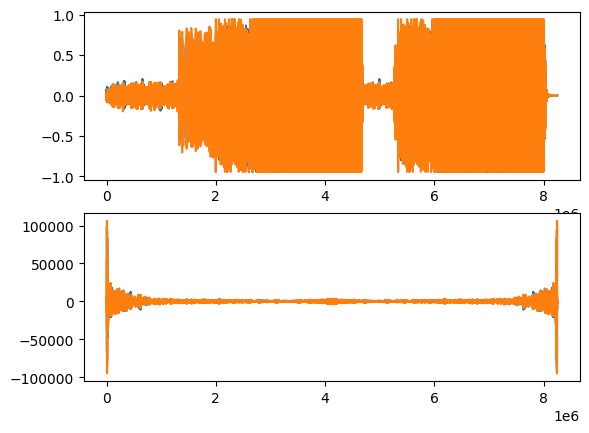

In [3]:
fig, ax = plt.subplots(2, 1)
ax[0].plot(data)
ax[1].plot(np.real(ft))
plt.show();

## Original file

In [4]:
pd.AudioSegment.from_wav("ff-16b-2c-44100hz.wav")

## highpass filter 

In [10]:
cutoff = 70000
h_id = (id>cutoff)
h_id = np.r_[h_id, np.fliplr(h_id[np.newaxis, :]).ravel()]
highpass = np.real(np.fft.ifft2((np.multiply(ft, h_id[:, np.newaxis]))))

sf.write("highpass.wav", data = highpass, samplerate=samplerate)
file = pd.AudioSegment.from_wav("highpass.wav")

In [11]:
file

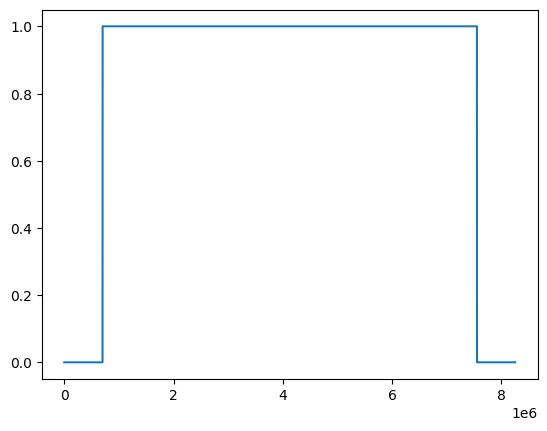

In [7]:
plt.plot(h_id);

## Lowpass filter

In [12]:
cutoff = 700000
h_id = (id<cutoff)
h_id = np.r_[h_id, np.fliplr(h_id[np.newaxis, :]).ravel()]
lowpass = np.real(np.fft.ifft2((np.multiply(ft, h_id[:, np.newaxis]))))

sf.write("lowpass.wav", data = lowpass, samplerate=samplerate)
file = pd.AudioSegment.from_wav("lowpass.wav")

In [13]:
file

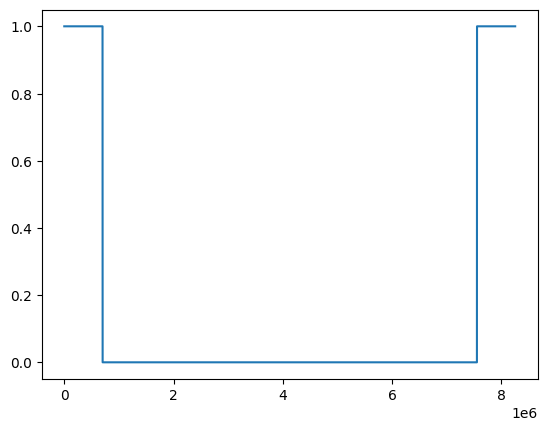

In [10]:
plt.plot(h_id);

## bandpass

In [11]:
cutoff = (100000, 900000)
h_id = np.logical_and(id>cutoff[0], id <cutoff[1])
h_id = np.r_[h_id, np.fliplr(h_id[np.newaxis, :]).ravel()]
bandpass = np.real(np.fft.ifft2((np.multiply(ft, h_id[:, np.newaxis]))))

sf.write("bandpass.wav", data = bandpass, samplerate=samplerate)
file = pd.AudioSegment.from_wav("bandpass.wav")

In [12]:
file

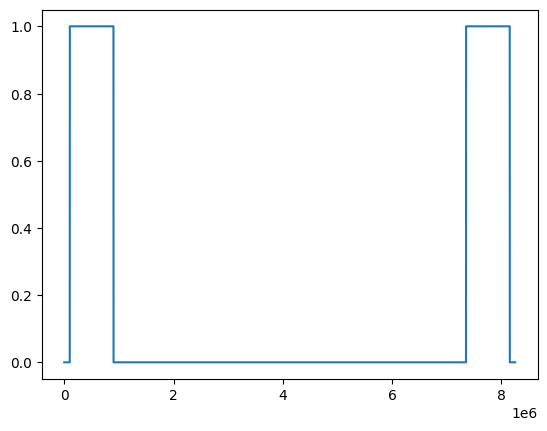

In [13]:
plt.plot(h_id);

## Bandstop

In [14]:
cutoff = (100000, 900000)
h_id = np.logical_or(id<cutoff[0], id>cutoff[1])
h_id = np.r_[h_id, np.fliplr(h_id[np.newaxis, :]).ravel()]
bandpass = np.real(np.fft.ifft2((np.multiply(ft, h_id[:, np.newaxis]))))

sf.write("bandpass.wav", data = bandpass, samplerate=samplerate)
file = pd.AudioSegment.from_wav("bandpass.wav")

In [15]:
file

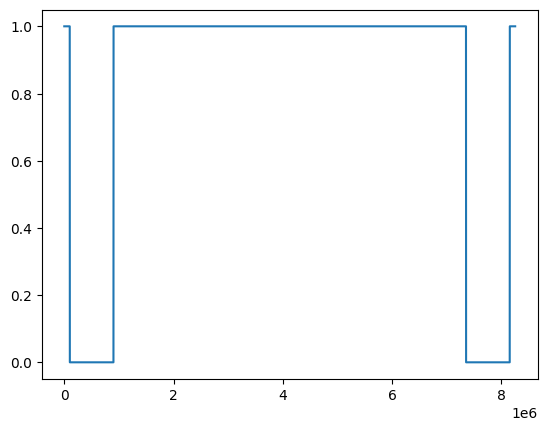

In [16]:
plt.plot(h_id);